[![Open In Studio Lab](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/machinelearnear/custom-segmentation-model-with-icevision-openimages/blob/main/0_train_custom_model.ipynb)

# Train Custom Image Segmentation Model with `IceVision` and `OpenImages`
- www.machinelearne.ar

## Download and prepare data
Sources:

- https://github.com/monocongo/openimages
- https://storage.googleapis.com/openimages/web/index.html

In [1]:
from openimages.download import download_segmentation_dataset

### Download annotations from `OpenImages`
Source: https://storage.googleapis.com/openimages/web/index.html

> Open Images is a dataset of ~9M images annotated with image-level labels, object bounding boxes, object segmentation masks, visual relationships, and localized narratives:
>
> It contains a total of 16M bounding boxes for 600 object classes on 1.9M images, making it the largest existing dataset with object location annotations. The boxes have been largely manually drawn by professional annotators to ensure accuracy and consistency. The images are very diverse and often contain complex scenes with several objects (8.3 per image on average).
Open Images also offers visual relationship annotations, indicating pairs of objects in particular relations (e.g. "woman playing guitar", "beer on table"), object properties (e.g. "table is wooden"), and human actions (e.g. "woman is jumping"). In total it has 3.3M annotations from 1,466 distinct relationship triplets.
In V5 we added segmentation masks for 2.8M object instances in 350 classes. Segmentation masks mark the outline of objects, which characterizes their spatial extent to a much higher level of detail.
In V6 we added 675k localized narratives: multimodal descriptions of images consisting of synchronized voice, text, and mouse traces over the objects being described. (Note we originally launched localized narratives only on train in V6, but since July 2020 we also have validation and test covered.)
Finally, the dataset is annotated with 59.9M image-level labels spanning 19,957 classes.

In [2]:
selected_label = "Hot dog" # class label among 600 available
data_dir = './data'

In [5]:
download_segmentation_dataset(
    dest_dir=f"{data_dir}/annotations", 
    class_labels=[selected_label,], 
    annotation_format="pascal", 
    meta_dir=f"{data_dir}/csv")

2022-01-05  16:34:12 INFO Reading bounding box data
2022-01-05  16:34:30 INFO Reading segmentation mask data
2022-01-05  16:34:43 INFO Downloading 43 train images and accompanying segmentation masks for class 'hot dog'
2022-01-05  16:34:43 INFO Opening segmentation mask zip files
Extracting mask images: 100%|██████████| 56/56 [00:00<00:00, 1752.40it/s]
2022-01-05  16:35:02 INFO Creating 43 train annotations (pascal) for class 'hot dog'
100%|██████████| 43/43 [00:00<00:00, 1457.82it/s]
2022-01-05  16:35:02 INFO Reading bounding box data
2022-01-05  16:35:02 INFO Reading segmentation mask data
2022-01-05  16:35:02 INFO Downloading 5 validation images and accompanying segmentation masks for class 'hot dog'
2022-01-05  16:35:02 INFO Opening segmentation mask zip files
Extracting mask images: 100%|██████████| 8/8 [00:00<00:00, 2347.45it/s]
2022-01-05  16:35:03 INFO Creating 5 validation annotations (pascal) for class 'hot dog'
100%|██████████| 5/5 [00:00<00:00, 300.86it/s]
2022-01-05  16:35

{'hot dog': {'images_dir': './data/annotations/hot dog/images',
  'segmentations_dir': './data/annotations/hot dog/segmentations',
  'annotations_dir': './data/annotations/hot dog/pascal'}}

### Convert annotations from `PASCAL` to `COCO`
Use the following custom function to generate `annotations.json` from your images + segmentation masks. Follow this article to get a better understanding of how `COCO` is structured: https://www.immersivelimit.com/tutorials/create-coco-annotations-from-scratch/#coco-dataset-format

In [3]:
def _create_coco_annotation_json(input_dir:str=None, class_label:str=None, fname:str='coco_annotation.json'):
    """
    Author: Nico Metallo
    Generates a COCO annotated json that maps images with segmentation masks
    :param input_dir: directory where OID V5 annotations are saved
    :param class_label: one of the 600 class labels available in OID 
    :param fname: output filename
    """
    from datetime import date
    from pathlib import Path
    from collections import defaultdict
    from PIL import Image
    import numpy as np
    import json
    import imantics
    
    # create list of images/segmentations
    data_dir = Path(f'{input_dir}/{class_label.lower()}')
    data_dir.mkdir(parents=True, exist_ok=True)
    images_dir = data_dir / 'images'
    annotations_dir = data_dir / 'pascal'
    segmentations_dir = data_dir / 'segmentations'
    list_of_images = [x for x in images_dir.rglob('*.jpg')]
    list_of_segmentations = [x for x in segmentations_dir.rglob('*.png')]
    
    # sanity check
    if not list_of_images or not list_of_segmentations:
        print('error! no images/segmentations have been found, please check your `input_dir`')
        return
    
    # create coco dict
    coco_segm_dict = defaultdict(list, { str(k):[] for k in list_of_images })
    for img in list_of_images:
        for mask in list_of_segmentations:
            if img.stem in str(mask): coco_segm_dict[str(img)].append(str(mask))

    # create base json
    coco = {
        "info": {
            "description": "Custom COCO Dataset",
            "url": "http://cocodataset.org",
            "version": "1.0",
            "year": 2020,
            "contributor": "Nicolas Metallo",
            "date_created": date.today().strftime("%d/%m/%Y")},
        "images": [],
        "annotations": [],
        "categories": [],
        }

    # merge images with segmentations and create json
    annotations=[]
    images=[]
    segm_id = 0
    print('processing...')
    for id, (img,masks) in enumerate(list(coco_segm_dict.items())):
        image = imantics.Image.from_path(img)
        for x in masks:
            array = np.asarray(Image.open(x).resize(image.size))
            image.add(imantics.Mask(array), category=imantics.Category(class_label))
            image.id = id
            coco_json = image.export(style='coco')
            annotation = coco_json['annotations'][0]
            # sanity check i.e. avoid invalid polygons
            annotation['segmentation'] = [x for x in annotation['segmentation'] if len(x) > 2]
            annotation['id'] = segm_id
            annotations.append(coco_json['annotations'][0])
            segm_id += 1
        images.append(coco_json['images'][0])
        
    # add to json and save to disk
    coco['categories'] = coco_json['categories']
    coco['annotations'] = annotations
    coco['images'] = images
    
    save_path = f'{input_dir}/{fname}'
    with open(save_path, 'w') as f:
        json.dump(coco, f)
    
    print(f"done! file was saved to `{save_path}`")
    return coco, save_path, images_dir

In [4]:
coco, save_path, images_dir = _create_coco_annotation_json(
    input_dir=f"{data_dir}/annotations", class_label=selected_label)

processing...
done! file was saved to `./data/annotations/coco_annotation.json`


### Parse, load, and preview data

In [5]:
from icevision.all import *

In [34]:
def _parser(save_path:str, images_dir:str, use_label:str):
    parser = parsers.COCOMaskParser(annotations_filepath=save_path, img_dir=images_dir)
    train_records, valid_records = parser.parse()
    class_map = ClassMap([use_label.lower()])
    show_records(train_records[:3], ncols=3, class_map=class_map)
    
    return parser, train_records, valid_records, class_map

  0%|          | 0/99 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/71 [00:00<?, ?it/s]

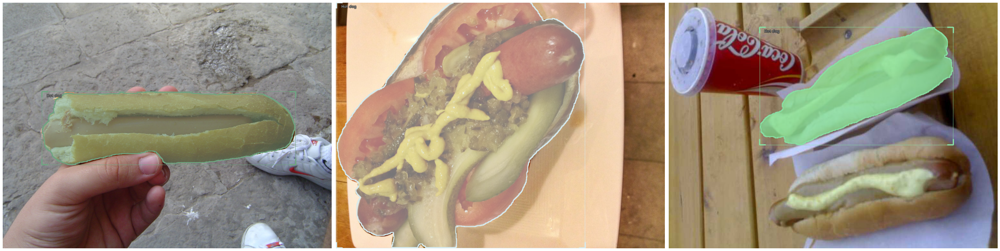

In [36]:
# Parse records with random splits
parser, train_records, valid_records, class_map = _parser(save_path, images_dir, selected_label)

## Train your model using `FastAI`

In [38]:
epochs=20
lr=5e-4
presize=512
image_size=384
bs=16
num_workers=4

### Prepare your data

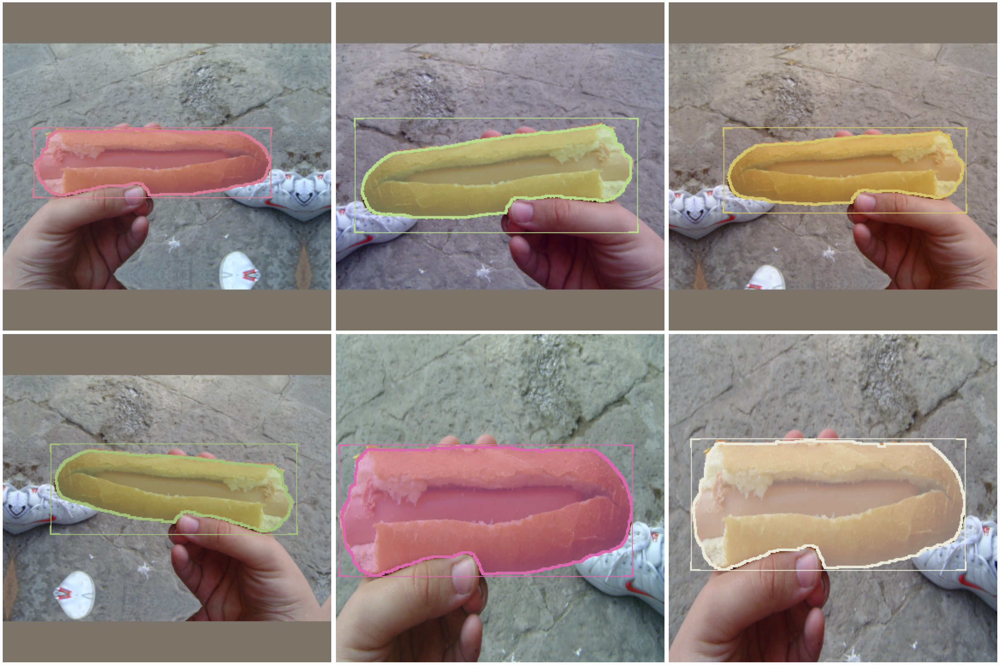

In [39]:
# Transforms
shift_scale_rotate = tfms.A.ShiftScaleRotate(rotate_limit=10)
crop_fn = partial(tfms.A.RandomSizedBBoxSafeCrop, p=0.5)
train_tfms = tfms.A.Adapter(
    [
        *tfms.A.aug_tfms(
            size=image_size, 
            presize=presize,
            shift_scale_rotate=shift_scale_rotate,
            crop_fn=crop_fn,
        ), 
        tfms.A.Normalize()
    ]
)
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

# Shows how the transforms affects a single sample
samples = [train_ds[0] for _ in range(6)]
show_samples(
    samples, denormalize_fn=denormalize_imagenet, ncols=3, display_label=False, show=True
)

### Define model object

In [40]:
# mask rcnn
model_type = models.torchvision.mask_rcnn
backbone = model_type.backbones.resnet50_fpn()
metrics = [COCOMetric(metric_type=COCOMetricType.mask)] # error with torchvision and fastai

# faster rcnn
# model_type = models.torchvision.faster_rcnn
# backbone = model_type.backbones.resnet50_fpn
# metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [41]:
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map))

### Create DataLoaders

In [42]:
train_dl = model_type.train_dl(train_ds, batch_size=bs, shuffle=True, num_workers=num_workers)
valid_dl = model_type.valid_dl(valid_ds, batch_size=bs, shuffle=False, num_workers=num_workers)

### Training

In [63]:
fastai_learner = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
if torch.cuda.device_count() > 1: fastai_learner.to_parallel()

In [64]:
fastai_learner.fine_tune(epochs, lr, freeze_epochs=2)

epoch,train_loss,valid_loss,time
0,0.339684,0.417782,00:06
1,0.351966,0.874099,00:06


epoch,train_loss,valid_loss,time
0,0.461098,0.438206,00:07
1,0.417002,0.443012,00:07
2,0.396633,0.396380,00:07
3,0.378331,0.448678,00:07
4,0.361726,0.384212,00:07
5,0.348880,0.420615,00:07
6,0.338130,0.407025,00:07
7,0.328940,0.384546,00:08
8,0.323469,0.496431,00:07
9,0.318327,0.408603,00:09


### Test on a subset from the validation data

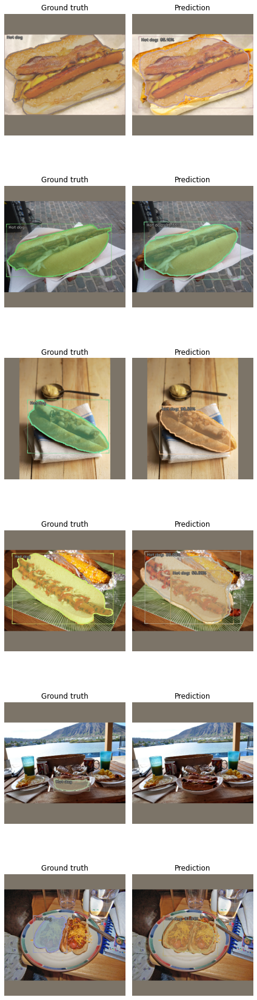

In [65]:
samples = [valid_ds[i] for i in range(6)]
preds = model_type.predict(model=model, dataset=samples)
show_preds(preds=preds, denormalize_fn=denormalize_imagenet)

### Save model weights to disk

In [67]:
model_dir='./model_store'
list_of_labels = [selected_label]

In [69]:
save_dir = Path(model_dir)
save_dir.mkdir(parents=True, exist_ok=True)

# eager mode - recommended from http://pytorch.org/docs/master/notes/serialization.html
with open(save_dir/'model.pth', 'wb') as f:
    torch.save(model.state_dict(), f)

# save list of classes, ordered by index!
if not isinstance(list_of_labels,list): list_of_labels = [list_of_labels]
with open(save_dir/'labels.txt', 'w') as f:
    for c in list_of_labels:
        f.write(f"{c}\n")

# scripted model - https://discuss.pytorch.org/t/torch-jit-trace-is-not-working-with-mask-rcnn/83244/8
with torch.no_grad():
    scripted_model = torch.jit.script(model.eval())
scripted_model.save(save_dir/'jit-model.pt')

print('finished!)

### Load saved model

In [70]:
device = "cuda" if torch.cuda.is_available() else "cpu"
use_label = 'choripan'
model_path = './model_store/model.pth'

In [71]:
class_map = ClassMap([use_label])

In [72]:
# mask rcnn
model_type = models.torchvision.mask_rcnn
backbone = model_type.backbones.resnet50_fpn

# faster rcnn
# model_type = models.torchvision.faster_rcnn
# backbone = model_type.backbones.resnet50_fpn

In [73]:
# load weights in eager mode
infer_model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map))
state_dict = torch.load(model_path, map_location=device)
infer_model.load_state_dict(state_dict)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home/studio-lab-user/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

<All keys matched successfully>

### Download sample image

In [74]:
import requests

In [75]:
def _download_image(url):
    res = requests.get(url, stream=True)
    img = PIL.Image.open(res.raw)
    return np.array(img)

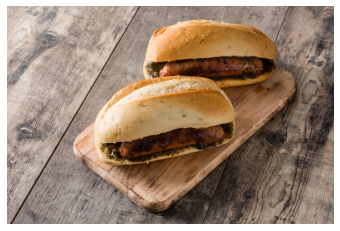

In [76]:
image_url = "https://i2.wp.com/www.buenossaborespanama.com/wp-content/uploads/2021/08/choripan-traditional-argentina-sandwich-with-chorizo-and-chimichurri-sauce-on-wooden-table-scaled.jpg?fit=2560%2C1707&ssl=1"
img = _download_image(image_url)
show_img(img);

### Pre-process image, run inference, and view results

In [81]:
image_size = 384
image_array = [img]

In [82]:
infer_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])
infer_ds = Dataset.from_images(image_array, infer_tfms, class_map=class_map)

In [86]:
preds = model_type.predict(model=infer_model, dataset=infer_ds, detection_threshold=0.6)

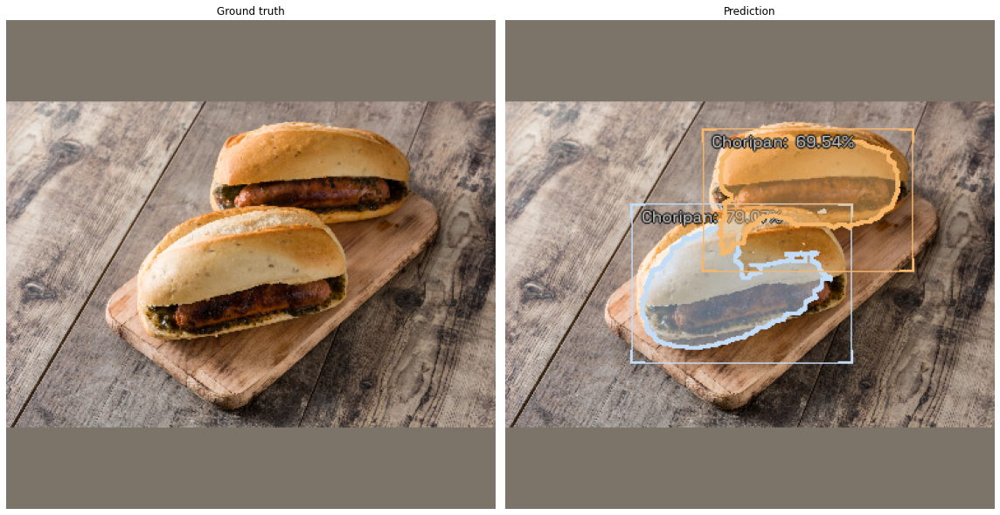

In [87]:
show_preds(preds=preds,show=True,figsize=(16,16))

### View results without IceVision

In [136]:
from torchvision import transforms
from PIL import Image, ImageOps

In [134]:
def _run_single_image_inference(image, model, image_size=384, score_threshold=0.5):
    if not isinstance(image,PIL.Image.Image): image = PIL.Image.fromarray(image)
    image_tfms = transforms.Compose([
        transforms.Resize(image_size), transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])])
    image_tensor = image_tfms(image).to(device)
    
    with torch.no_grad():
        model.to(device)
        model.eval()
        result = model([image_tensor])[0]
        
    boxes, masks, labels, scores = result['boxes'], result['masks'], result['labels'], result['scores']
    
    indices = scores > score_threshold
    boxes = boxes[indices].cpu()
    masks = masks[indices].cpu()
    labels = labels[indices].cpu()
    scores = scores[indices].cpu()
    
    
    PIL_image = ImageOps.contain(PIL_image, (image_size,image_size))
    
    return boxes, masks, labels, scores, PIL_image

In [138]:
PIL_image = PIL.Image.fromarray(img)

In [147]:
hpercent = (image_size/float(PIL_image.size[1]))

In [148]:
hpercent

0.22495606326889278

In [152]:
wsize = int((float(PIL_image.size[0])*float(hpercent)))

In [153]:
wsize

575

In [135]:
boxes, masks, labels, scores, PIL_image = _run_single_image_inference(
    img, infer_model, image_size=384, score_threshold=0.5)

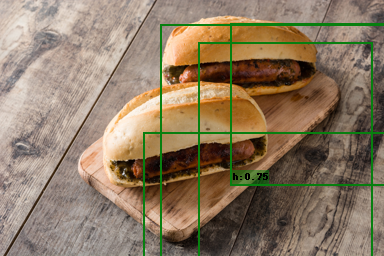

In [137]:
Image.fromarray(draw_boxes(PIL_image, boxes, labels, scores, class_name_map='choripan'))

In [114]:
import cv2
import numpy as np
import PIL.Image as Image
import PIL.ImageDraw as ImageDraw
import PIL.ImageFont as ImageFont

try:
    FONT = ImageFont.truetype('arial.ttf', 24)
except IOError:
    FONT = ImageFont.load_default()

palette = (2 ** 11 - 1, 2 ** 15 - 1, 2 ** 20 - 1)

In [110]:
def _draw_single_box(image, xmin, ymin, xmax, ymax, color=(0, 255, 0), display_str=None, font=None, width=2, alpha=0.5, fill=False):
    if font is None:
        font = FONT

    draw = ImageDraw.Draw(image, mode='RGBA')
    left, right, top, bottom = xmin, xmax, ymin, ymax
    alpha_color = color + (int(255 * alpha),)
    draw.rectangle([(left, top), (right, bottom)], outline=color, fill=alpha_color if fill else None, width=width)

    if display_str:
        text_bottom = bottom
        # Reverse list and print from bottom to top.
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle(
            xy=[(left + width, text_bottom - text_height - 2 * margin - width),
                (left + text_width + width, text_bottom - width)],
            fill=alpha_color)
        draw.text((left + margin + width, text_bottom - text_height - margin - width),
                  display_str,
                  fill='black',
                  font=font)

    return image

In [108]:
palette = (2 ** 11 - 1, 2 ** 15 - 1, 2 ** 20 - 1)

In [106]:
def compute_color_for_labels(label):
    """
    Simple function that adds fixed color depending on the class
    """
    color = [int((p * (label ** 2 - label + 1)) % 255) for p in palette]
    return tuple(color)

In [100]:
def draw_boxes(image,
               boxes,
               labels=None,
               scores=None,
               class_name_map=None,
               width=2,
               alpha=0.5,
               fill=False,
               font=None,
               score_format=':{:.2f}'):
    """Draw bboxes(labels, scores) on image
    Args:
        image: numpy array image, shape should be (height, width, channel)
        boxes: bboxes, shape should be (N, 4), and each row is (xmin, ymin, xmax, ymax)
        labels: labels, shape: (N, )
        scores: label scores, shape: (N, )
        class_name_map: list or dict, map class id to class name for visualization.
        width: box width
        alpha: text background alpha
        fill: fill box or not
        font: text font
        score_format: score format
    Returns:
        An image with information drawn on it.
    """
    boxes = np.array(boxes)
    num_boxes = boxes.shape[0]
    if isinstance(image, Image.Image):
        draw_image = image
    elif isinstance(image, np.ndarray):
        draw_image = Image.fromarray(image)
    else:
        raise AttributeError('Unsupported images type {}'.format(type(image)))

    for i in range(num_boxes):
        display_str = ''
        color = (0, 255, 0)
        if labels is not None:
            this_class = labels[i]
            color = compute_color_for_labels(this_class)
            class_name = class_name_map[this_class] if class_name_map is not None else str(this_class)
            display_str = class_name

        if scores is not None:
            prob = scores[i]
            if display_str:
                display_str += score_format.format(prob)
            else:
                display_str += 'score' + score_format.format(prob)

        draw_image = _draw_single_box(image=draw_image,
                                      xmin=boxes[i, 0],
                                      ymin=boxes[i, 1],
                                      xmax=boxes[i, 2],
                                      ymax=boxes[i, 3],
                                      color=color,
                                      display_str=display_str,
                                      font=font,
                                      width=width,
                                      alpha=alpha,
                                      fill=fill)

    image = np.array(draw_image, dtype=np.uint8)
    return image